<font size = 5 face="Times New Roman">__Project Description__</font>    
<font size = 4 face="Times New Roman">
The Anime and Otaku Culture has been popular around the world in recent decades. English speaking countries also have lots of anime funs. Most of them express their opinions or thoughts of anime on “MyAnimeList.net” (MAL) and “animenewsnetwork.com” (ANN). Thus, our project is to discover general taste and preference among anime fans in English speaking countries. More specifically, we have several analyzing aspects, which include but not limit to the following research questions:  
RQ1: What are the top 100 favorite anime on MAL and ANN?  
RQ2: How many of them are both in the top 100 list of MAL and ANN?  
RQ3: What are their favorite genres of anime on MAL and ANN?  
RQ4: Which anime are relatively controversial on ANN?  
RQ5: What are the top 20 anime in specific genre on MAL and ANN?  
RQ6: Which decades of anime are the most popular on MAL?  
RQ7: Categorizing the top 100 anime on MAL by source(original form), type(media form) and rating(age appropriate rating respectively).    
RQ8: Do the Spearman Rank Correlation between MAL and ANN score results.
</font>

<font size = 5 face="Times New Roman">__Data Source Description__</font>   
<font size = 4 face="Times New Roman">
Our two groups of datasets are extracted from the mentioned two websites, “myanimelist.net” and “animenewsnetwork.com” respectively. In terms of dataset from “myanimelist.net” website, we have the data about the description of anime. The file we prepare to use is “anime_cleaned.csv”. As for the dataset from “animenewsnetwork.com” website, similar as the former, it contains the data of anime in 3 aspects: title, genre, and score. We use it to compare the potential differences of analyzing results between “myanimelist.net” data and “animenewsnetwork.com” data, and combine them together to get an overview perspective.

Dataset on "myanimelist.net" website (MAL for abbreviation)    
(Too many columns in this CSV file, therefore two screenshots were taken)
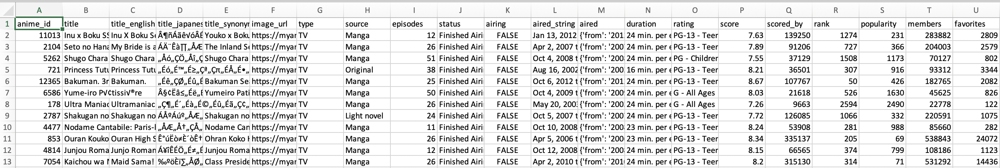
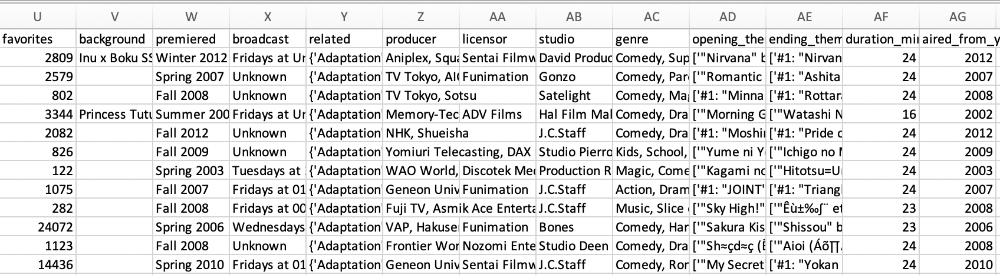
    
Dataset on "animenewsnetwork.com" website (ANN for abbreviation)    
(3 CSV files included.)
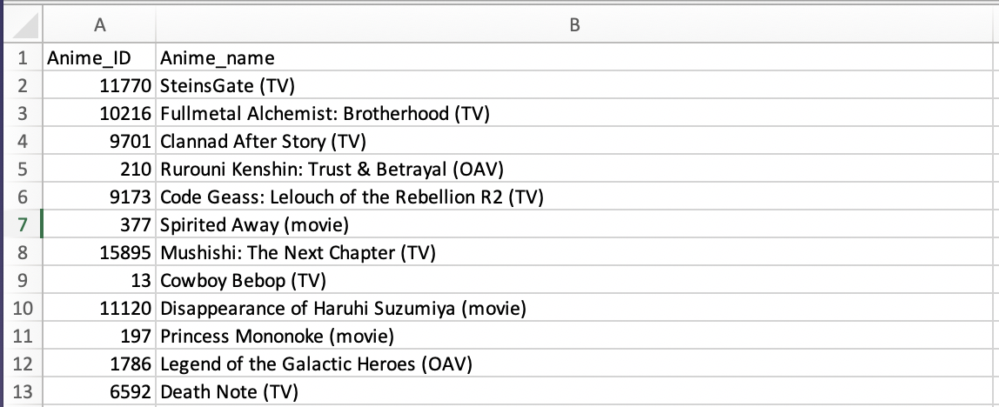
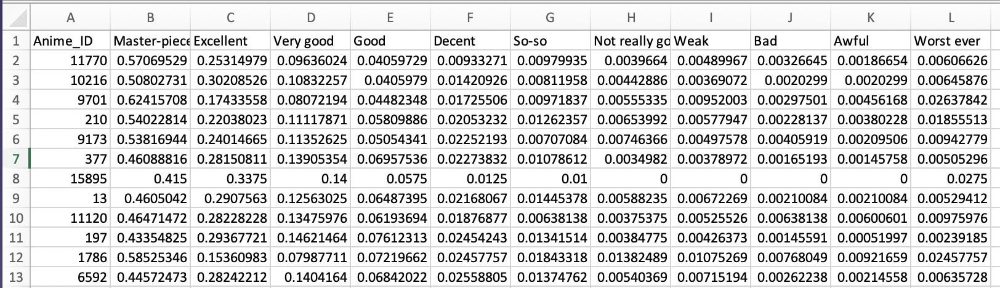
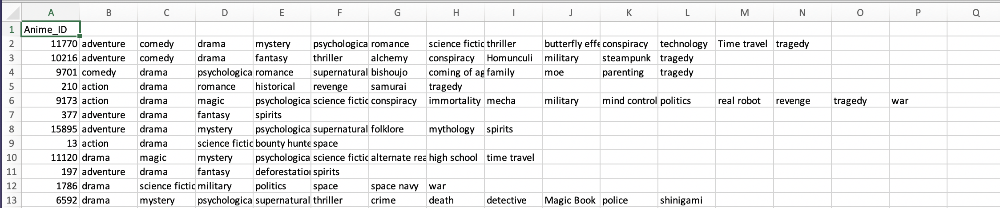
</font>

<font size = 5 face="Times New Roman">__Workflow__</font>   
<font size = 4 face = "Times New Roman">
In terms of dataset, we use python scripts to clean and preprocessing data. Then, we import our dataset into our database through the function of import in phpmyadmin or writing codes in python to insert data into the table. In the process of analyzing data, we use python to write codes to print analysis results or output the results in CSV files. Finally, We use Excel, SPSS and Tableau software to conduct data visualization in order to show results clearly. 
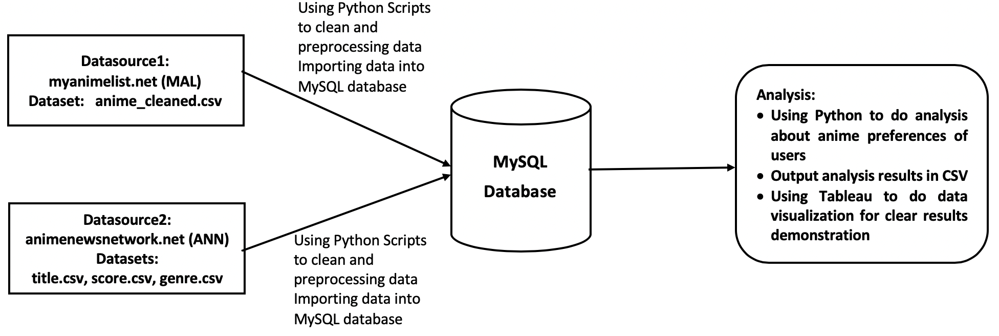
</font>

<font size = 5 face="Times New Roman">__Database Design__</font>   
<font size = 4 face="Times New Roman">
__ER Diagram__    
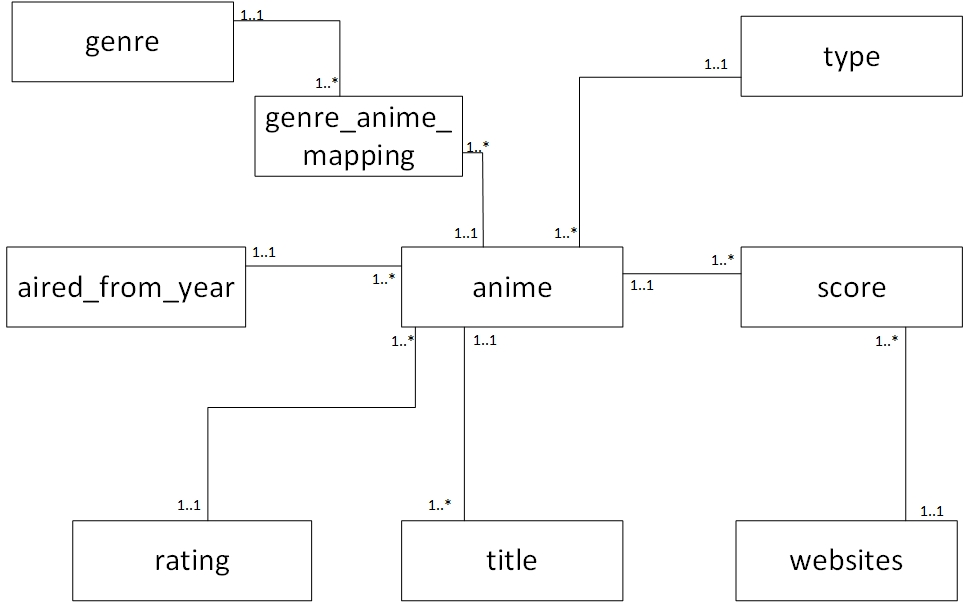
In the above ER Diagram, 
__type__ represents __media form__    
__rating__ represents __age appropriate rating__    
__title__ represents __anime name__

__Relational Vocabulary__    
anime __has many__ genre __through__ genre_anime_mapping    
genre __has many__ anime __through__ genre_anime_mapping    
genre_anime_mapping __belong to__ anime    
genre_anime_mapping __belong to__ genre    
aired_from_year __has many__ anime    
anime __belong to__ aired_from_year    
rating __has many__ anime    
anime __belong to__ rating    
anime __has many__ title    
title __belong to__ anime        
type __has many__ anime    
anime __belong to__ type    
anime __has many__ websites __through__ score    
websites __has many__ anime __through__ score    
score __belong to__ anime      
score __belong to__ websites    
__Table Sketch__     
For the anime table, We have not splitted the related columns into different tables. Though drawn in different entities in the ER diagram, they are just different columns in the same "anime" table in our real database.    
__anime table(from MAL)__    
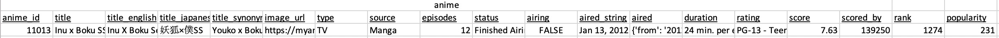    
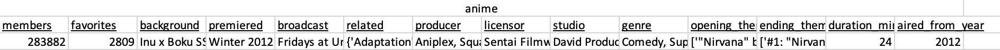    
__titles table(from ANN)__    
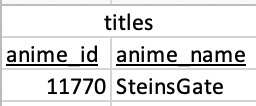    
__genres table(from ANN)__    
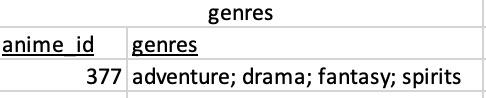    
__scores table(from ANN)__    
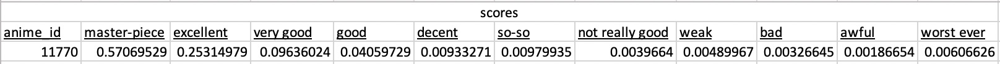    
__ann_mal_score table(Combined the two datasets by ourselves)__    
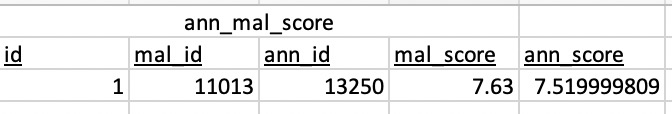    
</font>

In [3]:
#RQ1_MAL What are the top 100 favorite anime on MAL?
import pymysql.cursors

connection = pymysql.connect(
            host="mariadb",
            user="root",
            passwd="",
            db="final_project", 
            autocommit=True,
            cursorclass=pymysql.cursors.DictCursor
            )
cursor = connection.cursor()
sql = """
SELECT title_japanese, title_english, score, members 
FROM anime 
WHERE members>10000 
ORDER BY score DESC 
LIMIT 100"""
cursor.execute(sql)
results = cursor.fetchall()
for row in results:
    print(row["title_japanese"], ",", row["title_english"], ",", row["score"], ",", row["members"])

鋼の錬金術師 FULLMETAL ALCHEMIST , Fullmetal Alchemist: Brotherhood , 9.25 , 1199091
君の名は。 , Your Name. , 9.19 , 730076
銀魂° , Gintama Season 4 , 9.15 , 198744
シュタインズ・ゲート ゼロ ,  , 9.15 , 223989
STEINS;GATE , Steins;Gate , 9.14 , 1010330
HUNTER×HUNTER ハンターハンター , Hunter x Hunter , 9.11 , 720920
銀魂&#039; , Gintama Season 2 , 9.11 , 215527
銀河英雄伝説 , Legend of the Galactic Heroes , 9.11 , 124993
3月のライオン 第2シリーズ , March Comes In Like A Lion 2nd Season , 9.10 , 85744
銀魂&#039; 延長戦 , Gintama: Enchousen , 9.07 , 123572
聲の形 , A Silent Voice , 9.04 , 511915
劇場版 銀魂 完結篇 万事屋よ永遠なれ ,  , 9.04 , 105458
終物語 , Owarimonogatari Second Season , 9.02 , 113928
銀魂。 , Gintama Season 5 , 9.02 , 91695
CLANNAD〜AFTER STORY〜 クラナド アフターストーリー , Clannad ~After Story~ , 9.01 , 607387
銀魂 , Gintama , 9.01 , 459031
ハイキュー!! 烏野高校 VS 白鳥沢学園高校 , Haikyu!! 3rd Season , 8.99 , 252062
コードギアス 反逆のルルーシュ 続編 , Code Geass: Lelouch of the Rebellion R2 , 8.95 , 791396
千と千尋の神隠し , Spirited Away , 8.92 , 705769
メイドインアビス , Made in Abyss , 8.91 , 326011
四月は

In [4]:
#RQ1_ANN What are the top 100 favorite anime on ANN?
# The Same Process as the above cell
import pymysql.cursors

connection = pymysql.connect(
            host="mariadb",
            user="root",
            passwd="",
            db="final_project", 
            autocommit=True,
            cursorclass=pymysql.cursors.DictCursor
            )
cursor = connection.cursor()
sql = """
SELECT anime_name, average_score 
FROM titles, scores 
WHERE titles.anime_id = scores.anime_id 
ORDER BY average_score DESC 
LIMIT 100"""
cursor.execute(sql)
results = cursor.fetchall()
for row in results:
    print(row["anime_name"], ",", row["average_score"])

SteinsGate , 9.1843210458
Fullmetal Alchemist: Brotherhood , 9.1105369992
Code Geass: Lelouch of the Rebellion R2 , 9.0305093621
Clannad After Story , 8.9835382769
Gekijōban Gintama Kanketsu-hen: Yorozuya yo Eien Nare , 8.9694656480
Spirited Away , 8.9623943249
Cowboy Bebop , 8.9333613446
Princess Mononoke , 8.9271006656
Rurouni Kenshin: Trust & Betrayal , 8.9199999996
Disappearance of Haruhi Suzumiya , 8.8933933941
Death Note , 8.8740464073
Code Geass: Lelouch of the Rebellion , 8.8687163372
anohana: The Flower We Saw That Day , 8.8399734403
Cross Game , 8.8384146335
Mushishi: The Next Chapter , 8.8350000000
Bunny Drop , 8.8209399167
Maria Watches Over Us 3rd Season , 8.8166431590
One Piece Episode of Nami: Kōkaishi no Namida to Nakama no Kizuna , 8.8128342252
Mushi-Shi , 8.8033995491
Evangelion: 2.0 You Can (Not) Advance , 8.8015075388
Gintama' , 8.7994652408
Summer Wars , 8.7828624075
Maria Watches Over Us 4th Season , 8.7757575749
Monster , 8.7694824505
Kabaneri of the Iron Fortres

<Font size = 5 face = "Times New Roman" >Visualization Results - RQ1: What are the top 100 favorite anime on MAL and ANN?</Font>    
<Font size = 4 face = "Times New Roman" >
Each box represents an anime item, the deeper color the box is, the topper anime the box represents.
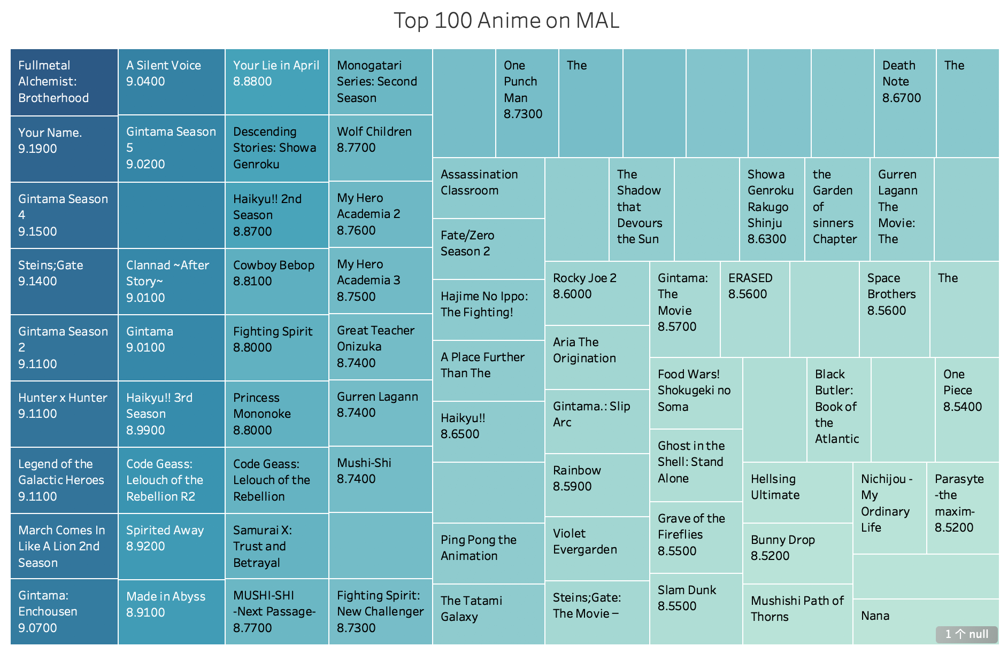
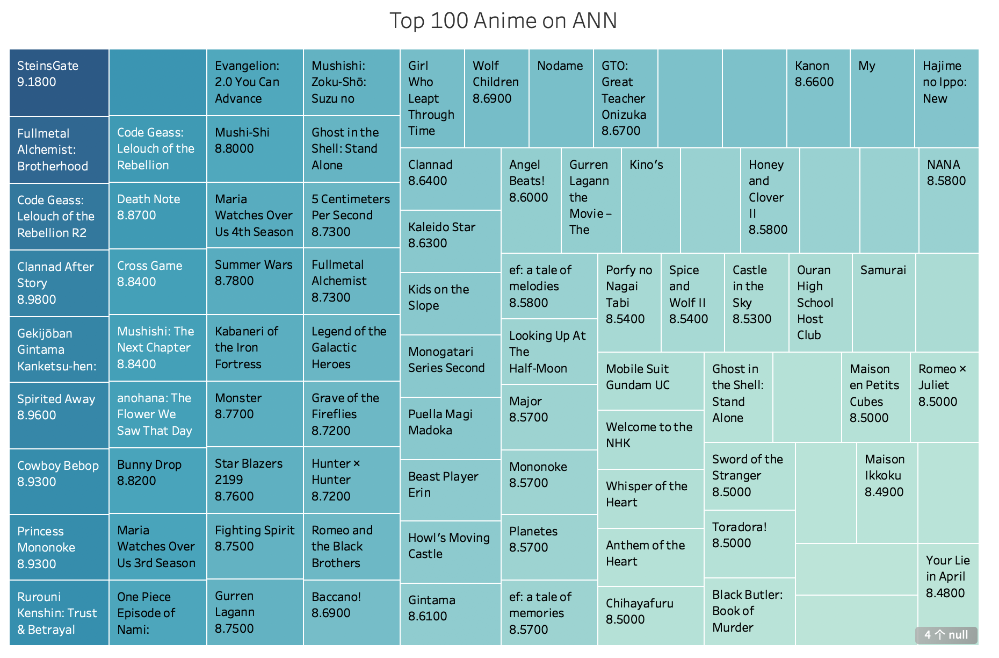
</Font>

In [17]:
#RQ2
connection = pymysql.connect(
            host="mariadb",
            user="root", 
            passwd="",  
            db="final_project",
            autocommit=True,
            cursorclass=pymysql.cursors.DictCursor
            )

with connection.cursor() as cursor:
    sql = """
    SELECT count(anime_name) as count_same
    FROM 
        (SELECT anime_name, score 
        FROM titles join scores 
        on titles.anime_id = scores.anime_id
        ORDER BY score DESC 
        LIMIT 100)ann 
        join
        (SELECT title, title_english, score 
        FROM anime 
        ORDER BY score DESC 
        LIMIT 100) mal
        on ann.anime_name = mal.title_english
    """
    cursor.execute(sql)
    results = cursor.fetchall()
    count_same_anime = results[0]["count_same"]
    print("There are " + count_same_anime + " anime items that have appeared on both top lists.")

There are 22 anime items that have appeared on both top lists.


In [5]:
#RQ3_MAL What are their favorite genres of anime on MAL?
import pymysql.cursors

connection = pymysql.connect(
            host="mariadb",
            user="root",
            passwd="",
            db="final_project",
            autocommit=True,
            cursorclass=pymysql.cursors.DictCursor
            )
with connection.cursor() as cursor:
    sql = """
    SELECT title_english, title_japanese, score, genre, members
    FROM anime
    WHERE members > 10000
    ORDER BY score DESC 
    LIMIT 100
    """
    cursor.execute(sql)
    results = cursor.fetchall()
    genre_dict = dict()
    for row in results:
        temp_genres = row["genre"].replace(" ", "")
        genres = temp_genres.split(",")
        for genre in genres:
            if genre == "":
                continue
            if genre not in genre_dict.keys():
                genre_dict[genre] = 1
            else:
                genre_dict[genre] += 1
    print(genre_dict)
    

{'Action': 37, 'Military': 6, 'Adventure': 18, 'Comedy': 45, 'Drama': 46, 'Magic': 2, 'Fantasy': 23, 'Shounen': 37, 'Supernatural': 36, 'Romance': 15, 'School': 19, 'Historical': 22, 'Parody': 11, 'Samurai': 11, 'Sci-Fi': 26, 'Thriller': 7, 'SuperPower': 8, 'Space': 4, 'Game': 2, 'Seinen': 16, 'SliceofLife': 28, 'Mystery': 19, 'Vampire': 5, 'Sports': 11, 'Mecha': 5, 'Music': 2, 'Josei': 3, 'MartialArts': 1, 'Shoujo': 8, 'Ecchi': 3, 'Horror': 3, 'Police': 3, 'Psychological': 6, 'Kids': 1, 'Demons': 2}


In [6]:
#RQ3_ANN What are their favorite genres of anime on ANN?
import pymysql.cursors

connection = pymysql.connect(
            host="mariadb",
            user="root",
            passwd="",
            db="final_project", 
            autocommit=True,
            cursorclass=pymysql.cursors.DictCursor
            )
cursor = connection.cursor()
sql = """
SELECT anime_name, genres
FROM titles, genres, scores
WHERE titles.anime_id = genres.anime_id 
AND titles.anime_id = scores.anime_id
ORDER BY average_score DESC 
LIMIT 100
"""
cursor.execute(sql)
results = cursor.fetchall()
genre_dict = dict()
for row in results:
    temp_genres = row["genres"].replace(" ", "")
    genres = temp_genres.split(";")
    for genre in genres:
        if genre == "":
            continue
        if genre not in genre_dict.keys():
            genre_dict[genre] = 1
        else:
            genre_dict[genre] += 1
print(genre_dict)

{'adventure': 24, 'comedy': 30, 'drama': 82, 'mystery': 11, 'psychological': 19, 'romance': 35, 'sciencefiction': 25, 'thriller': 8, 'butterflyeffect': 1, 'conspiracy': 5, 'technology': 2, 'Timetravel': 1, 'tragedy': 16, 'fantasy': 17, 'alchemy': 3, 'Homunculi': 2, 'military': 11, 'steampunk': 4, 'action': 22, 'magic': 4, 'immortality': 3, 'mecha': 6, 'mindcontrol': 2, 'politics': 5, 'realrobot': 3, 'revenge': 6, 'war': 6, 'supernatural': 19, 'bishoujo': 2, 'comingofage': 4, 'family': 6, 'moe': 6, 'parenting': 2, 'spirits': 8, 'bountyhunters': 2, 'space': 6, 'deforestation': 1, 'historical': 9, 'samurai': 4, 'alternatereality': 1, 'highschool': 4, 'timetravel': 2, 'crime': 4, 'death': 4, 'detective': 2, 'MagicBook': 1, 'police': 4, 'shinigami': 1, 'Alternatehistory': 1, 'school': 10, 'ghosts': 1, 'growingup': 4, 'lovetriangle': 2, 'tournament': 7, 'baseball': 2, 'sports': 4, 'tsundere': 2, 'folklore': 5, 'mythology': 2, 'sliceoflife': 12, 'adoption': 1, 'singleparents': 1, 'shoujo-ai':

<Font size = 5 face = "Times New Roman" >Visualization Results - RQ2: How many of them are both in the top 100 list of MAL and ANN?</Font>    
<Font size = 4 face = "Times New Roman" >
Each circle represents an anime genre with its appearing times amoung top 100 anime, the bigger size the circle is, the more popular anime genre the circle represents.
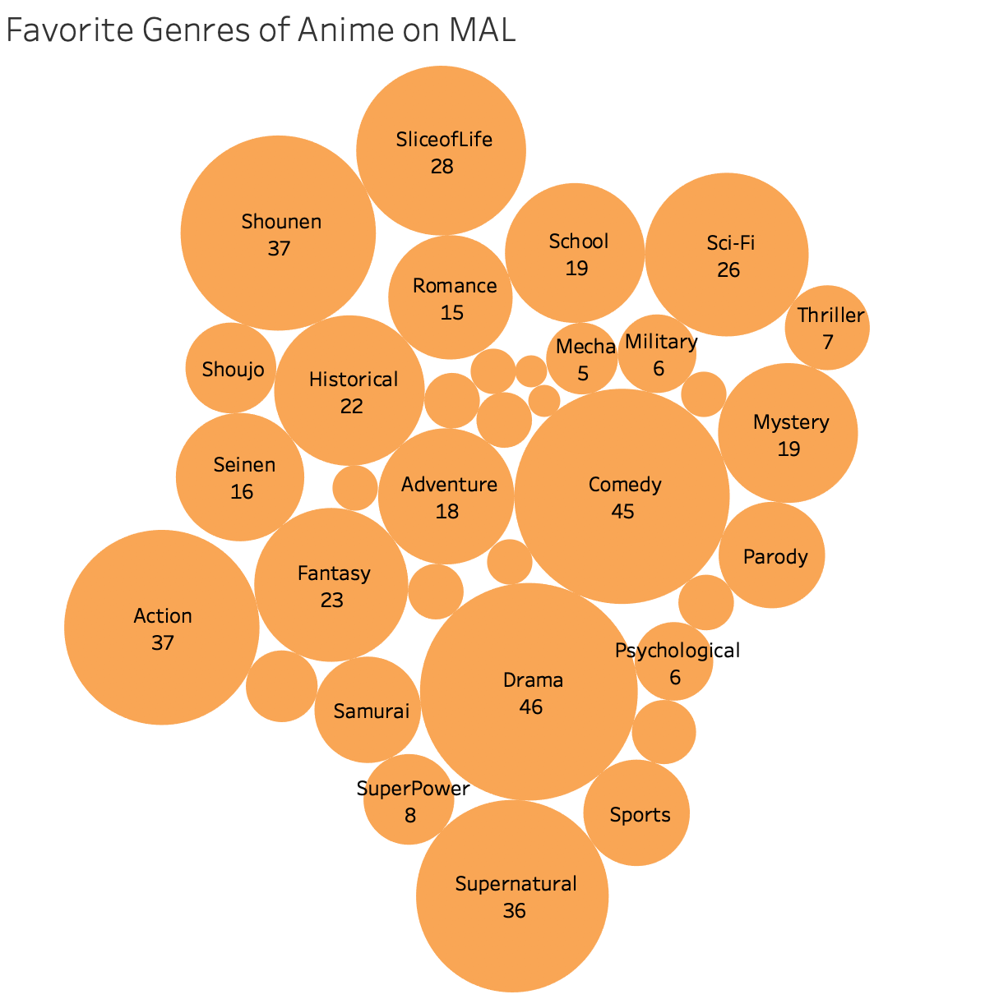
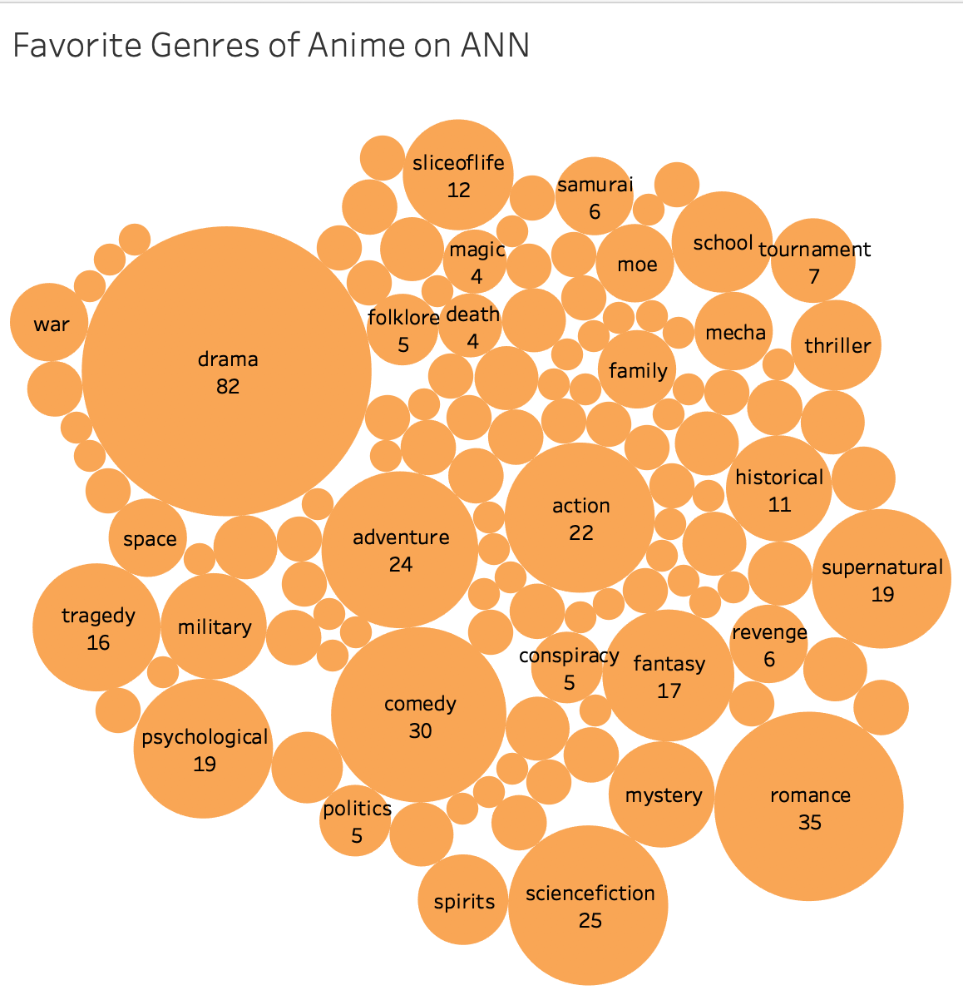
</Font>

In [7]:
#RQ4_ANN Which anime are relatively controversial on ANN?
import pymysql.cursors

connection = pymysql.connect(
            host="mariadb",
            user="root",
            passwd="",
            db="final_project", 
            autocommit=True,
            cursorclass=pymysql.cursors.DictCursor
            )
cursor = connection.cursor()
sql_variance = """
SELECT anime_name, average_score, (10-average_score)*(10-average_score)*master_piece + (9-average_score)*(9-average_score)*excellent+(8-average_score)*(8-average_score)*very_good+(7-average_score)*(7-average_score)*good+(6-average_score)*(6-average_score)*decent+(5-average_score)*(5-average_score)*so_so+(4-average_score)*(4-average_score)*not_really_good+(3-average_score)*(3-average_score)*weak+(2-average_score)*(2-average_score)*bad+(1-average_score)*(1-average_score)*awful+(0-average_score)*(0-average_score)*worst_ever AS variance
FROM titles, scores
WHERE titles.anime_id = scores.anime_id
ORDER BY variance DESC
LIMIT 100
"""
cursor.execute(sql_variance)
results = cursor.fetchall()
for row in results:
    print(row["anime_name"], ",", row["average_score"], ",", row["variance"])

Musashi , 4.7571428570 , 19.455306122693877551000000000000
Manga Sekai Mukashi Banashi , 6.7272727266 , 17.652892560218181818634380165244
Sekai Meisaku Dōwa: Mori wa Ikiteiru , 5.2857142861 , 16.632653060618367346790000000000
Bosco Daibōken , 6.0588235298 , 11.937716261541868511960000000000
Evangelion Shin Gekijō-ban: ? , 7.0833333332 , 11.854166668177777777760000000000
Ikkyū-san , 6.1904761906 , 11.487528346214512471640000000000
PoPoLoCrois , 4.7894736839 , 11.218836563835457063912936288079
Saint Seiya: The Lost Canvas , 6.2727272726 , 11.107438013645454545598016528924
Bobobo-bo Bo-bobo , 4.7557077626 , 10.410640937346102041240000000000
Apocalypse Zero , 3.7261904772 , 10.234552157012485827397596371984
Super Milk-chan Show , 3.6263269653 , 9.851875897068142047762381480818
Mad Bull 34 , 5.6166666664 , 9.786388890151111111040000000000
Garzey's Wing , 3.3274336290 , 9.760043857414253270080021928200
Sengoku Basara - Samurai Kings: The Movie , 5.5660377351 , 9.57897234844478462113428622279

<Font size = 5 face = "Times New Roman" >Visualization Results - RQ4: Which anime are relatively controversial on ANN?</Font>    
<Font size = 4 face = "Times New Roman" >
Each box represents an anime item, the deeper color the box is, the more controversial anime the box represents.
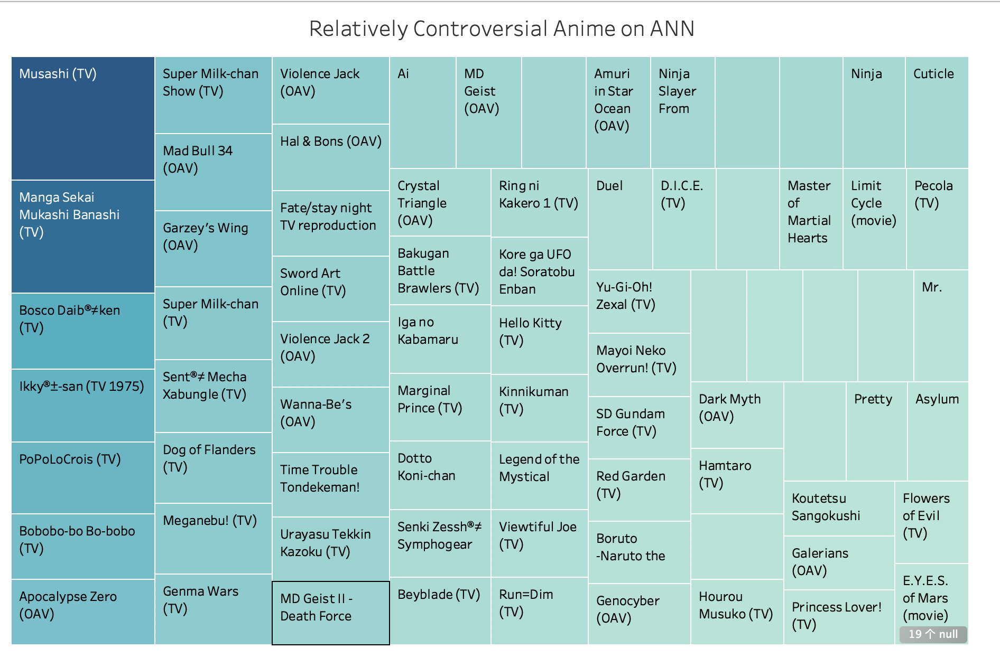
</Font>

In [8]:
#RQ5_MAL What are the top 20 anime in specific genre on MAL?
import pymysql.cursors

connection = pymysql.connect(
            host="mariadb",
            user="root",
            passwd="",
            db="final_project", 
            autocommit=True,
            cursorclass=pymysql.cursors.DictCursor
            )
cursor = connection.cursor()
sql_Sci_Fi = """
SELECT title_japanese, title_english, score, members 
FROM anime
WHERE genre LIKE '%Sci-Fi%'
ORDER BY score DESC 
LIMIT 20
"""
cursor.execute(sql_Sci_Fi)
results = cursor.fetchall()
print("Top 20 anime in Sci-Fi")
for row in results:
    print(row["title_japanese"], ",", row["title_english"], ",", row["score"], ",", row["members"])

print("")
sql_Romance = """
SELECT title_japanese, title_english, score, members 
FROM anime 
WHERE genre LIKE '%Romance%'
ORDER BY score DESC 
LIMIT 20
"""
cursor.execute(sql_Romance)
results = cursor.fetchall()
print("Top 20 anime in Romance")
for row in results:
    print(row["title_japanese"], ",", row["title_english"], ",", row["score"], ",", row["members"])

print("")
sql_School = """
SELECT title_japanese, title_english, score, members 
FROM anime
WHERE genre LIKE '%School%'
ORDER BY score DESC 
LIMIT 20
"""
cursor.execute(sql_School)
results = cursor.fetchall()
print("Top 20 anime in School")
for row in results:
    print(row["title_japanese"], ",", row["title_english"], ",", row["score"], ",", row["members"])

print("")
sql_Fantasy = """
SELECT title_japanese, title_english, score, members 
FROM anime
WHERE genre LIKE '%Fantasy%'
ORDER BY score DESC 
LIMIT 20
"""
cursor.execute(sql_Fantasy)
results = cursor.fetchall()
print("Top 20 anime in Fantasy")
for row in results:
    print(row["title_japanese"], ",", row["title_english"], ",", row["score"], ",", row["members"])

print("")
sql_Adventure = """
SELECT title_japanese, title_english, score, members 
FROM anime
WHERE genre LIKE '%Adventure%'
ORDER BY score DESC 
LIMIT 20
"""
cursor.execute(sql_Adventure)
results = cursor.fetchall()
print("Top 20 anime in Adventure")
for row in results:
    print(row["title_japanese"], ",", row["title_english"], ",", row["score"], ",", row["members"])

Top 20 anime in Sci-Fi
銀魂° , Gintama Season 4 , 9.15 , 198744
シュタインズ・ゲート ゼロ ,  , 9.15 , 223989
STEINS;GATE , Steins;Gate , 9.14 , 1010330
銀魂&#039; , Gintama Season 2 , 9.11 , 215527
銀河英雄伝説 , Legend of the Galactic Heroes , 9.11 , 124993
銀魂&#039; 延長戦 , Gintama: Enchousen , 9.07 , 123572
劇場版 銀魂 完結篇 万事屋よ永遠なれ ,  , 9.04 , 105458
銀魂。 , Gintama Season 5 , 9.02 , 91695
銀魂 , Gintama , 9.01 , 459031
コードギアス 反逆のルルーシュ 続編 , Code Geass: Lelouch of the Rebellion R2 , 8.95 , 791396
メイドインアビス , Made in Abyss , 8.91 , 326011
銀魂. 銀ノ魂篇 ,  , 8.85 , 42265
カウボーイビバップ , Cowboy Bebop , 8.81 , 707773
コードギアス 反逆のルルーシュ , Code Geass: Lelouch of the Rebellion , 8.79 , 986897
天元突破グレンラガン , Gurren Lagann , 8.74 , 787535
涼宮ハルヒの消失 , The Disappearance of Haruhi Suzumiya , 8.73 , 323704
ワンパンマン , One Punch Man , 8.73 , 1020754
天元突破グレンラガン 螺巌篇 , Gurren Lagann The Movie: The Lights in the Sky are Stars , 8.62 , 114333
銀魂。ポロリ編 , Gintama.: Slip Arc , 8.59 , 53820
ARIA The ORIGINATION , Aria The Origination , 8.59 , 71049

Top 20 an

In [9]:
#RQ5_ANN What are the top 20 anime in specific genre on ANN?
import pymysql.cursors

connection = pymysql.connect(
            host="mariadb",
            user="root",
            passwd="",
            db="final_project", 
            autocommit=True,
            cursorclass=pymysql.cursors.DictCursor
            )
cursor = connection.cursor()
sql_sciencefiction = """
SELECT anime_name, average_score
FROM titles, scores, genres
WHERE titles.anime_id = scores.anime_id
AND titles.anime_id = genres.anime_id
AND genres.genres LIKE '%science fiction%'
ORDER BY average_score DESC 
LIMIT 20
"""
cursor.execute(sql_sciencefiction)
results = cursor.fetchall()
print("Top 20 anime in science fiction")
for row in results:
    print(row["anime_name"], ",", row["average_score"])

print("")
sql_romance = """
SELECT anime_name, average_score
FROM titles, scores, genres
WHERE titles.anime_id = scores.anime_id
AND titles.anime_id = genres.anime_id
AND genres.genres LIKE '%romance%'
ORDER BY average_score DESC 
LIMIT 20
"""
cursor.execute(sql_romance)
results = cursor.fetchall()
print("Top 20 anime in romance")
for row in results:
    print(row["anime_name"], ",", row["average_score"])

print("")
sql_school = """
SELECT anime_name, average_score
FROM titles, scores, genres
WHERE titles.anime_id = scores.anime_id
AND titles.anime_id = genres.anime_id
AND genres.genres LIKE '%school%'
ORDER BY average_score DESC 
LIMIT 20
"""
cursor.execute(sql_school)
results = cursor.fetchall()
print("Top 20 anime in school")
for row in results:
    print(row["anime_name"], ",", row["average_score"])

print("")
sql_fantasy = """
SELECT anime_name, average_score
FROM titles, scores, genres
WHERE titles.anime_id = scores.anime_id
AND titles.anime_id = genres.anime_id
AND genres.genres LIKE '%fantasy%'
ORDER BY average_score DESC 
LIMIT 20
"""
cursor.execute(sql_fantasy)
results = cursor.fetchall()
print("Top 20 anime in fantasy")
for row in results:
    print(row["anime_name"], ",", row["average_score"])

print("")
sql_adventure = """
SELECT anime_name, average_score
FROM titles, scores, genres
WHERE titles.anime_id = scores.anime_id
AND titles.anime_id = genres.anime_id
AND genres.genres LIKE '%adventure%'
ORDER BY average_score DESC 
LIMIT 20
"""
cursor.execute(sql_adventure)
results = cursor.fetchall()
print("Top 20 anime in adventure")
for row in results:
    print(row["anime_name"], ",", row["average_score"])

Top 20 anime in science fiction
SteinsGate , 9.1843210458
Code Geass: Lelouch of the Rebellion R2 , 9.0305093621
Cowboy Bebop , 8.9333613446
Disappearance of Haruhi Suzumiya , 8.8933933941
Code Geass: Lelouch of the Rebellion , 8.8687163372
Evangelion: 2.0 You Can (Not) Advance , 8.8015075388
Gintama' , 8.7994652408
Summer Wars , 8.7828624075
Star Blazers 2199 , 8.7588932803
Gurren Lagann , 8.7456425400
Ghost in the Shell: Stand Alone Complex 2nd GIG , 8.7405037978
Legend of the Galactic Heroes , 8.7311827954
Girl Who Leapt Through Time , 8.6871518757
Nausicaä of the Valley of the Wind , 8.6729906158
Time of Eve , 8.6666666674
Time of Eve , 8.6478973629
Gurren Lagann the Movie – The Lights in the Sky Are Stars , 8.6031390123
Gintama' , 8.6028708138
Melancholy of Haruhi Suzumiya , 8.5757726333
Planetes , 8.5653650266

Top 20 anime in romance
SteinsGate , 9.1843210458
Clannad After Story , 8.9835382769
Rurouni Kenshin: Trust & Betrayal , 8.9199999996
anohana: The Flower We Saw That Day ,

<Font size = 5 face = "Times New Roman" >RQ5 Results: Top 20 anime in Sci-Fi, Romance, School, Fantasy and Adventure respectively</Font>   
<Font size = 4 face = "Times New Roman" >
ANN:
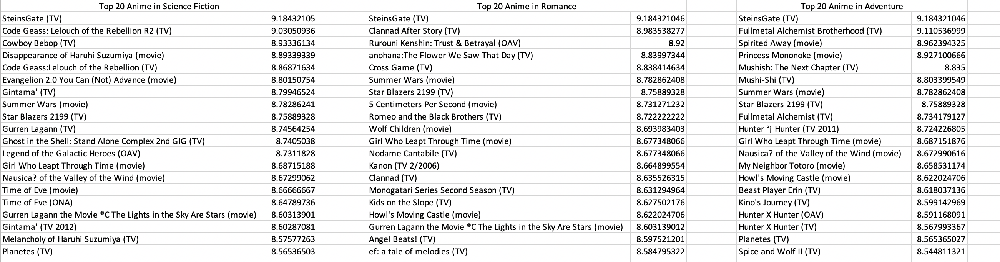
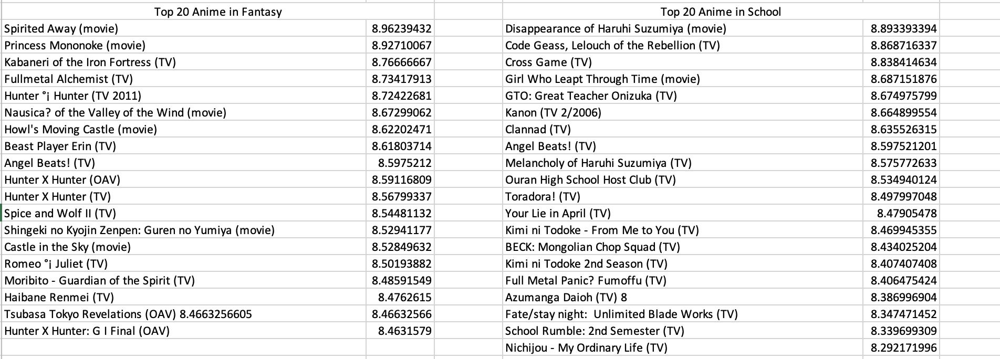
MAL:
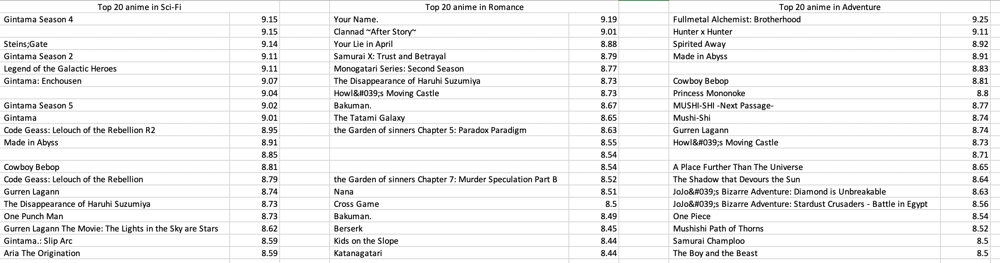
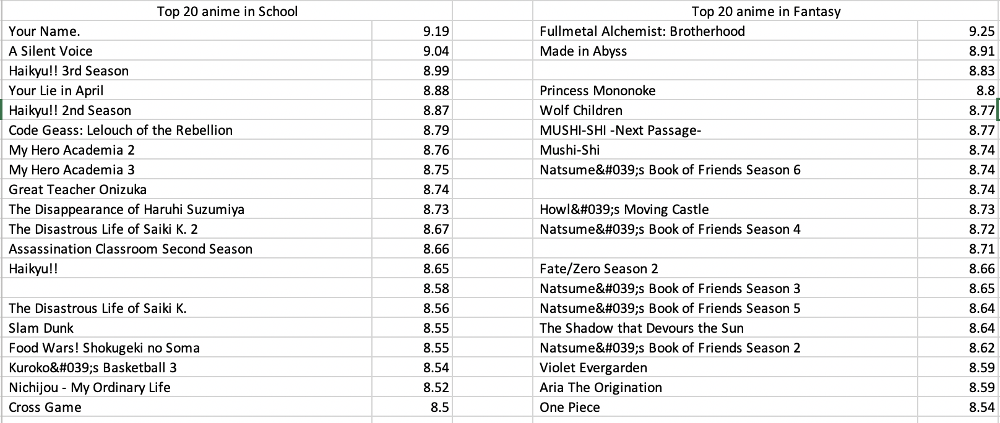
</Font>

In [11]:
#RQ6 Which decades of anime are the most popular on MAL?
import pymysql.cursors
connection = pymysql.connect(
            host="mariadb",
            user="root",
            passwd="",
            db="final_project",
            autocommit=True,
            cursorclass=pymysql.cursors.DictCursor
            )
with connection.cursor() as cursor:
    sql = "SELECT title_japanese, members, aired_from_year FROM anime ORDER BY members DESC LIMIT 100"
    cursor.execute(sql)
    results = cursor.fetchall()
    times_dict_5 = dict()
    times_dict_10 = dict()
    for row in results:
        year = row["aired_from_year"]
        time_5 = year - year%5
        time_10 = year - year%10
        if time_5 not in times_dict_5.keys():
            times_dict_5[time_5] = row["members"]
        else:
            times_dict_5[time_5] += row["members"]
        if time_10 not in times_dict_10.keys():
            times_dict_10[time_10] = row["members"]
        else:
            times_dict_10[time_10] += row["members"]
    print(times_dict_5)
    print(times_dict_10)

{2005: 16958485, 2010: 30032875, 2015: 11877688, 2000: 5155943, 1995: 2576506, 1985: 979571}
{2000: 22114428, 2010: 41910563, 1990: 2576506, 1980: 979571}


<Font size = 5 face = "New Times Roman">Visualization Results - RQ6: Which decades of anime are the most popular on MAL?</Font>
<Font size = 4 face = "New Times Roman">
We have visulized the results of RQ6 in bar chart. Each bar represents a popularity degree of one decade(5 years or 10 years), the higher the bar is, the more popularity the anime in that decade has    
Decade in 5 years    
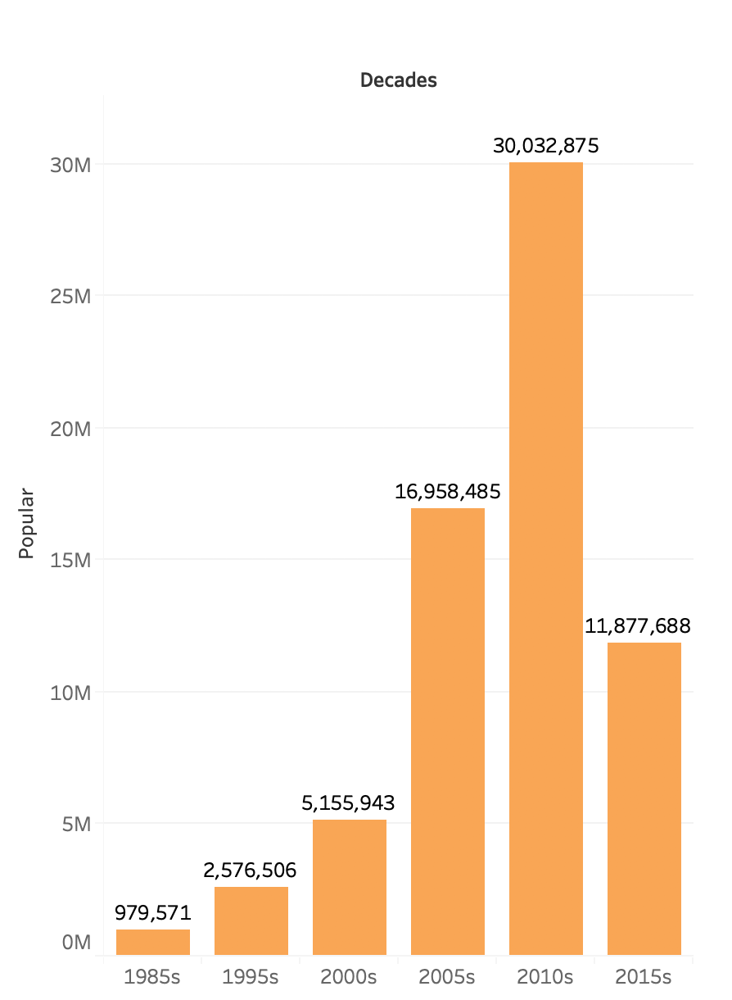
Decade in 10 years    
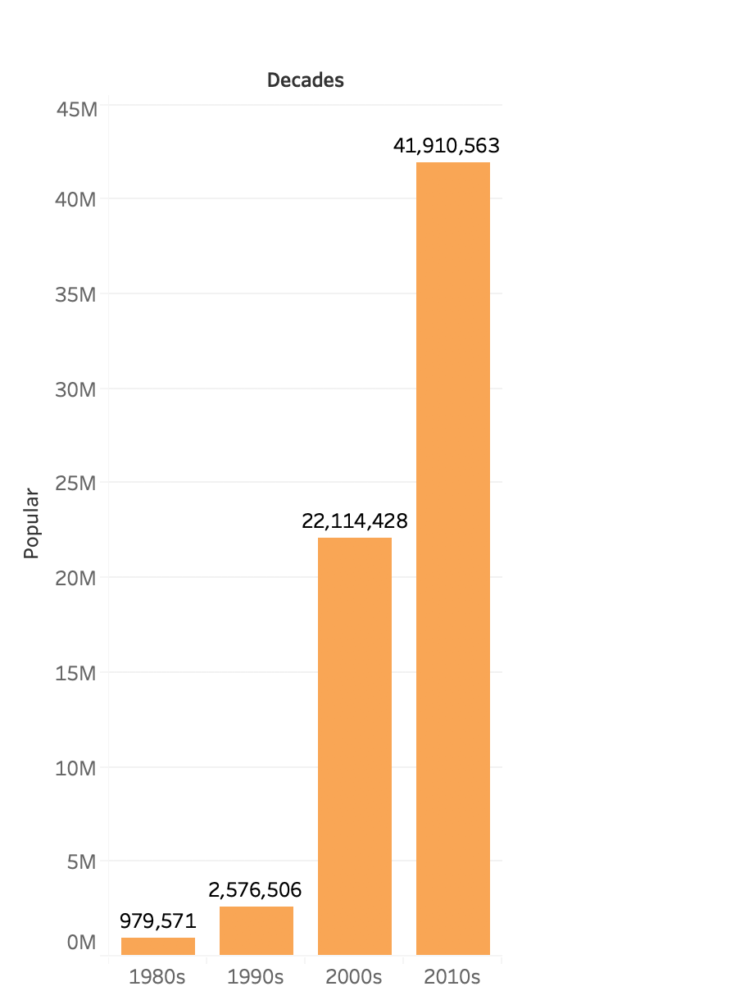
</Font>

In [13]:
#RQ7 Categorizing the top 100 anime on MAL in different ways. 
# Ways of categorizing are by original form, media form and age appopriate ratings respectively
import pymysql.cursors

connection = pymysql.connect(
            host="mariadb",
            user="root",
            passwd="",
            db="final_project", 
            autocommit=True,
            cursorclass=pymysql.cursors.DictCursor
            )
cursor = connection.cursor()
sql_count_source = """
SELECT count(source) AS number, source
FROM
(
SELECT source 
FROM anime
WHERE members>10000 
ORDER BY score DESC 
LIMIT 100
) AS source
GROUP BY source
"""
cursor.execute(sql_count_source)
results = cursor.fetchall()
source_count = dict()
for row in results:
    source_count[row["source"]] = row["number"]
print(source_count)

sql_count_type = """
SELECT count(type) AS number, type
FROM
(
SELECT type 
FROM anime 
WHERE members>10000 
ORDER BY score DESC 
LIMIT 100
) AS type
GROUP BY type
"""
cursor.execute(sql_count_type)
results = cursor.fetchall()
type_count = dict()
for row in results:
    type_count[row["type"]] = row["number"]
print(type_count)

sql_count_rating = """
SELECT count(rating) AS number, rating
FROM
(
SELECT rating
FROM anime
WHERE members>10000 
ORDER BY score DESC 
LIMIT 100
) AS rating
GROUP BY rating
"""
cursor.execute(sql_count_rating)
results = cursor.fetchall()
rating_count = dict()
for row in results:
    rating_count[row["rating"]] = row["number"]
print(rating_count)

{'Light novel': 9, 'Manga': 67, 'Novel': 5, 'Original': 11, 'Other': 1, 'Visual novel': 4, 'Web manga': 3}
{'Movie': 21, 'OVA': 4, 'Special': 2, 'TV': 73}
{'G - All Ages': 4, 'PG - Children': 2, 'PG-13 - Teens 13 or older': 63, 'R - 17+ (violence & profanity)': 28, 'R+ - Mild Nudity': 3}


<Font size = 5 face = "New Times Roman">Visualization Results - RQ7: Categorizing the top 100 anime on MAL in 3 Ways</Font>
<Font size = 4 face = "New Times Roman">
We use pie chart to visualize the results of RQ7    
__Top 100 anime in different original forms__
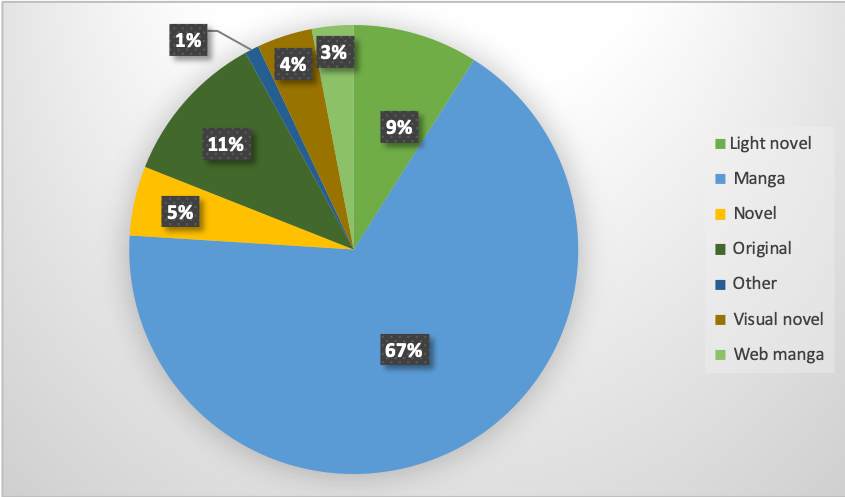
__Top 100 anime in different media forms__
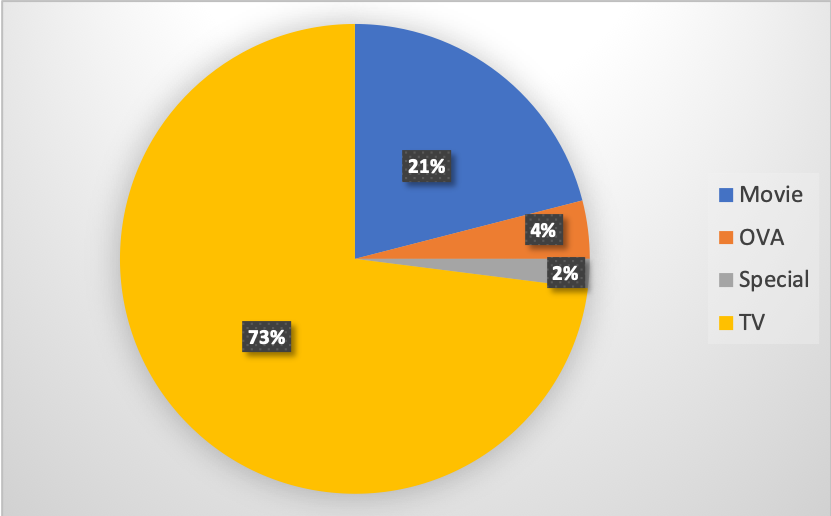
__Top 100 anime in different age appropriate ratings__
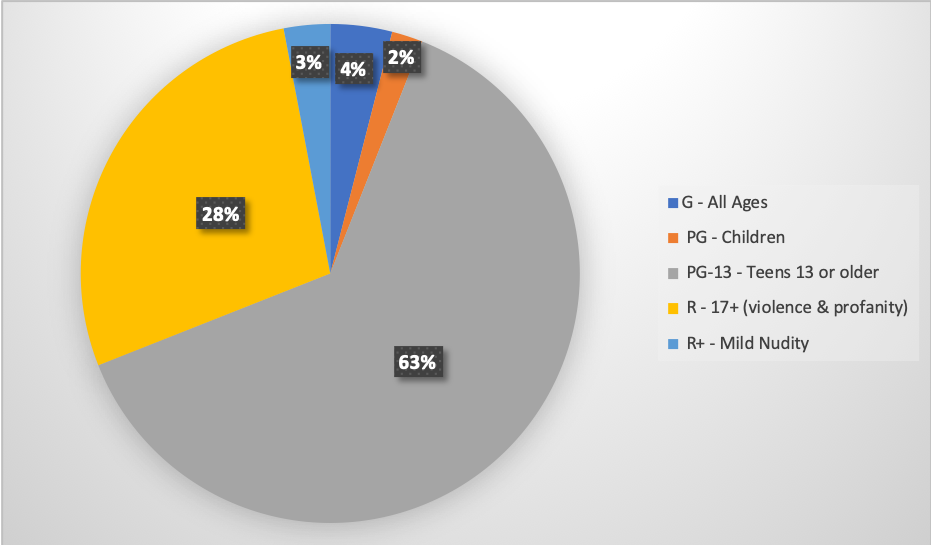
</Font> 

In [ ]:
#RQ8.Do the Spearman Rank Correlation between MAL and ANN score results
#This cell of code saves the data from ann_mal_score to CSV file
import csv
import pymysql.cursors

connection = pymysql.connect(
            host="mariadb",
            user="root", 
            passwd="",  
            db="final_project",
            autocommit=True,
            cursorclass=pymysql.cursors.DictCursor
            )

with connection.cursor() as cursor:
    
        sql = """
        SELECT mal_score, ann_score 
        FROM ann_mal_score
        """
        cursor.execute(sql)
        results = cursor.fetchall() 
        
column_names = ['mal_score','ann_score']

with open('ann_mal_score.csv', 'w') as csvfile:
    myCsvWriter = csv.DictWriter(csvfile,
                                 delimiter=',',
                                 quotechar='"',
                                 fieldnames = column_names)

    myCsvWriter.writeheader() # uses contents of column_names

    # write the rows. We iterate through the list of dicts.
    for row in results:
        # every row must have all keys from column_names
        myCsvWriter.writerow(row)

print("Done writing csv")

<Font size = 5 face = "New Times Roman">RQ8 Results</Font>    
<Font size = 4 face = "New Times Roman">
We use the CSV file created from the above cell to do the Spearman Rank Correlation on SPSS software.    
And here is the result:    
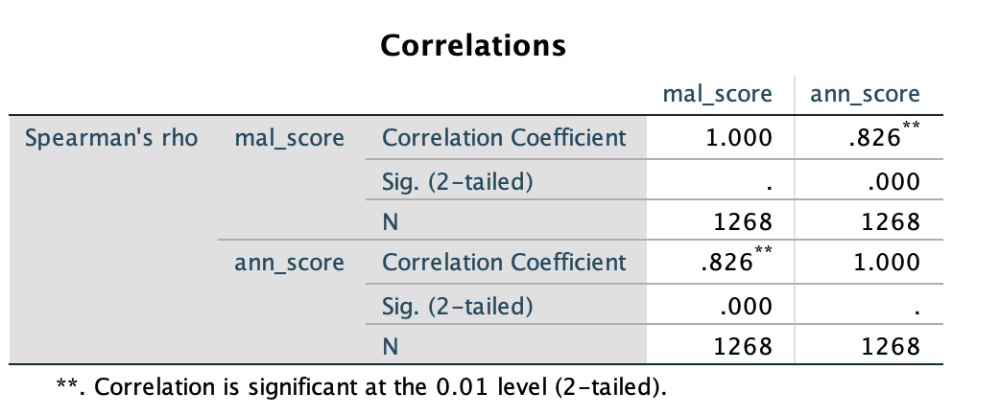
</Font>

<Font size = 5 face = "New Times Roman">Challenges We have Met in the Project</Font>    
<Font size = 4 face = "New Times Roman">
When working on the project, we have met 2 major challenges.    
The first one was to deal with the title column in titles table. When we firstly imported the CSV File to our database, the Value in title column was like this "SteinsGate (TV)". We did not want our title cantain media form information. So we write a python script to remove the media form information from the title value. And the new title should be like this "SteinsGate". It would only contain title. This script is in the following cell.    
The second one, and also the hardest one, was to match the same anime item in two different datasets. What made this challenge really hard was that the same anime may have different name in two datasets. Because of the limitation of time, this time we just match those rows that had completely same english titles. We wrote a SQL script to do realize this goal.    
<Font size = 3.5 color = #1E37D8 face = "Courier">
__create table mal_ann(    
    select anime.anime_id as mal_id, titles.anime_id as ann_id    
    from anime join titles    
    on anime.title_english = titles.anime_name
    );__    
</Font>
The above SQL scripts has successfully helped us to connect the two datasets together.
However, the limitation was obvious as well. There were certainly other anime items that had different names in both datasets. These anime items cannot be fetched successfully to the mal_ann table. In fact, we have 6000+ rows in MAL dataset, 4000+ rows in ANN dataset. But the mal_ann table only contained 1000+ rows, which was obviously far less than the expected number of rows in common.
To improve this issue in the future, we can use the ___Fuzzy String Matching Algorithm___ as we have discussed together with Prof. James. We can build a matrix and calculate the steps it takes to change the MAL title to ANN title. This method would definitely increase the match results in mal_ann tables and further more bring us a more precise results in RQ2 and RQ8.
</Font>

In [ ]:
# ANN anime title modifying
# The goal of this python script is about separate the old anime title into new title without media_form,
# and store the media_form information into extra tables
# For example, the old anime title is "SteinsGate (TV)", so we should change the title into "SteinsGate" and store the string "TV" 
# into the media form table
# This script should be only executed once

import pymysql.cursors
connection = pymysql.connect(
            host="mariadb",
            user="root",
            passwd="",
            db="final_project", 
            autocommit=True,
            cursorclass=pymysql.cursors.DictCursor
            )
cursor = connection.cursor()
sql = "SELECT anime_id, anime_name FROM titles"
cursor.execute(sql)
results = cursor.fetchall()
for row in results:
    name = row["anime_name"]
    end = start = 0
    for i in range(len(name)-1, -1, -1):
        if name[i] == ")":
            end = i
        elif name[i] == "(":
            start = i
            break
    media_form = name[start+1:end]
    new_name = name[0:start-1]
    sql_insert = "INSERT INTO media_forms(anime_id, media_form) VALUE (%(anime_id)s,%(media_form)s)"
    param_dict = {"anime_id":row["anime_id"], "media_form": media_form}
    cursor.execute(sql_insert, param_dict)
    sql_update = "UPDATE titles SET anime_name = \"{}\" WHERE anime_id = {}".format(new_name, row["anime_id"])
    cursor.execute(sql_update)

<Font size = 5 face = "New Times Roman">How to learn Analysis Tool: SPSS and Tableau</Font>    
<Font size = 4 face = "New Times Roman">
In our project, we used two analysis tools to conduct data visualization. One was SPSS software, which was used for producing Spearman Rank Correlation. We studied it online through the following website.    
https://statistics.laerd.com/spss-tutorials/spearmans-rank-order-correlation-using-spss-statistics.php;    
The first step was to import the data into SPSS. Then it was easy to produce the results following the steps on the website.    
Another tool was Tableau, which was used for data visualization. We studied it through the tutorial online and learning videos on the Tableau official website.    
https://www.tutorialspoint.com/tableau/    
https://www.tableau.com/learn    
In the process of analysis, there were two primary steps, including connecting data to a file or a server and customizing the data view, which was convenient to analyze data and visualize data clearly and intuitively.
</Font>